<a href="https://colab.research.google.com/github/ykato27/Metric-Learning/blob/main/PyTroch_Metric_Learning_DeepAdversarialMetricLearning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PyTorch Metric Learning
### Example for the DeepAdversarialMetricLearning trainer
See the documentation [here](https://kevinmusgrave.github.io/pytorch-metric-learning/)

## Install the necessary packages

In [1]:
!pip install -q pytorch-metric-learning[with-hooks]
!pip install umap-learn

     |████████████████████████████████| 105 kB 5.7 MB/s 
     |████████████████████████████████| 89.7 MB 7.4 kB/s 
     |████████████████████████████████| 80 kB 3.8 MB/s 
     |████████████████████████████████| 1.1 MB 17.8 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.1-py3-none-any.whl size=76564 sha256=58371e3e2a6180fee8cac19b7d6f43a05147d5fecb722caeea0d2c359eddfcb0
  Stored in directory: /root/.cache/pip/wheels/01/e7/bb/347dc0e510803d7116a13d592b10cc68262da56a8eec4dd72f
  Created wheel for pynndescent: filename=pynndescent-0.5.4-py3-none-any.whl size=52373 sha256=8c98dc9430c49fe2afd8136c4b03123c5021928b91eccc32eca7739316f24f06
  Stored in directory: /root/.cache/pip/wheels/d0/5b/62/3401692ddad12324249c774c4b15ccb046946021e2b581c043
Successfully built umap-learn pynndescent


## Import the packages

In [2]:
%matplotlib inline
from pytorch_metric_learning import losses, miners, samplers, trainers, testers
from pytorch_metric_learning.utils import common_functions
import pytorch_metric_learning.utils.logging_presets as logging_presets
from pytorch_metric_learning.utils.accuracy_calculator import AccuracyCalculator
import numpy as np
import torchvision
from torchvision import datasets, transforms
import torch
import torch.nn as nn
from PIL import Image
import logging
import matplotlib.pyplot as plt
import umap
from cycler import cycler
import record_keeper
import pytorch_metric_learning
logging.getLogger().setLevel(logging.INFO)
logging.info("VERSION %s"%pytorch_metric_learning.__version__)
    

INFO:root:VERSION 0.9.99


## Simple model def

In [3]:
class MLP(nn.Module):
    # layer_sizes[0] is the dimension of the input
    # layer_sizes[-1] is the dimension of the output
    def __init__(self, layer_sizes, final_relu=False):
        super().__init__()
        layer_list = []
        layer_sizes = [int(x) for x in layer_sizes]
        num_layers = len(layer_sizes) - 1
        final_relu_layer = num_layers if final_relu else num_layers - 1
        for i in range(len(layer_sizes) - 1):
            input_size = layer_sizes[i]
            curr_size = layer_sizes[i + 1]
            if i < final_relu_layer:
                layer_list.append(nn.ReLU(inplace=False))
            layer_list.append(nn.Linear(input_size, curr_size))
        self.net = nn.Sequential(*layer_list)
        self.last_linear = self.net[-1]

    def forward(self, x):
        return self.net(x)

## Initialize models, optimizers and image transforms

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Set trunk model and replace the softmax layer with an identity function
trunk = torchvision.models.resnet18(pretrained=True)
trunk_output_size = trunk.fc.in_features
trunk.fc = common_functions.Identity()
trunk = torch.nn.DataParallel(trunk.to(device))

# Set embedder model. This takes in the output of the trunk and outputs 64 dimensional embeddings
embedder = torch.nn.DataParallel(MLP([trunk_output_size, 64]).to(device))

# Set the generator model. The input size must be 3*trunk_output_size and the output must be trunk_output_size. 
generator = torch.nn.DataParallel(MLP([3*trunk_output_size, trunk_output_size, trunk_output_size], final_relu=True))

# Set optimizers
trunk_optimizer = torch.optim.Adam(trunk.parameters(), lr=0.00001, weight_decay=0.0001)
embedder_optimizer = torch.optim.Adam(embedder.parameters(), lr=0.0001, weight_decay=0.0001)
generator_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0001, weight_decay=0.0001)

# Set the image transforms
train_transform = transforms.Compose([transforms.Resize(64),
                                    transforms.RandomResizedCrop(scale=(0.16, 1), ratio=(0.75, 1.33), size=64),
                                    transforms.RandomHorizontalFlip(0.5),
                                    transforms.ToTensor(),
                                    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

val_transform = transforms.Compose([transforms.Resize(64),
                                    transforms.ToTensor(),
                                    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])





Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

## Create the dataset and class-disjoint train/val splits

In [5]:
# Download the original datasets
original_train = datasets.CIFAR100(root="CIFAR100_Dataset", train=True, transform=None, download=True)
original_val = datasets.CIFAR100(root="CIFAR100_Dataset", train=False, transform=None, download=True)

# This will be used to create train and val sets that are class-disjoint
class ClassDisjointCIFAR100(torch.utils.data.Dataset):
    def __init__(self, original_train, original_val, train, transform):
        rule = (lambda x: x < 50) if train else (lambda x: x >=50)
        train_filtered_idx = [i for i,x in enumerate(original_train.targets) if rule(x)]
        val_filtered_idx = [i for i,x in enumerate(original_val.targets) if rule(x)]
        self.data = np.concatenate([original_train.data[train_filtered_idx], original_val.data[val_filtered_idx]], axis=0)
        self.targets = np.concatenate([np.array(original_train.targets)[train_filtered_idx], np.array(original_val.targets)[val_filtered_idx]], axis=0)
        self.transform = transform
        
    def __len__(self):
        return len(self.data)
        
    def __getitem__(self, index):            
        img, target = self.data[index], self.targets[index]
        img = Image.fromarray(img)
        if self.transform is not None:
            img = self.transform(img)
        return img, target

# Class disjoint training and validation set
train_dataset = ClassDisjointCIFAR100(original_train, original_val, True, train_transform)
val_dataset = ClassDisjointCIFAR100(original_train, original_val, False, val_transform)
assert set(train_dataset.targets).isdisjoint(set(val_dataset.targets))

  0%|          | 0/169001437 [00:00<?, ?it/s]

Extracting CIFAR100_Dataset/cifar-100-python.tar.gz to CIFAR100_Dataset
Files already downloaded and verified


##Create the loss, miner, sampler, and package them into dictionaries


In [6]:
# Set the loss function
metric_loss = losses.TripletMarginLoss(margin=0.1)
synth_loss = losses.TripletMarginLoss(margin=0.1)
g_adv_loss = losses.TripletMarginLoss(margin=0.1)

# Set the mining function
miner = miners.MultiSimilarityMiner(epsilon=0.1)

# Set the dataloader sampler
sampler = samplers.MPerClassSampler(train_dataset.targets, m=4, length_before_new_iter=len(train_dataset))

# Set other training parameters
batch_size = 32
num_epochs = 4

# Package the above stuff into dictionaries.
models = {"trunk": trunk, "embedder": embedder, "generator": generator}
optimizers = {"trunk_optimizer": trunk_optimizer, "embedder_optimizer": embedder_optimizer, "generator_optimizer": generator_optimizer}
loss_funcs = {"metric_loss": metric_loss, "synth_loss": synth_loss, "g_adv_loss": g_adv_loss}
mining_funcs = {"tuple_miner": miner}

# Each loss will be scaled by these weights.
# g_hard_loss and g_reg_loss are defined inside the trainer.
# Specifying these weights is optional.
loss_weights = {"metric_loss": 1, 
                "synth_loss": 0.1,
                "g_adv_loss": 0.1,
                "g_hard_loss": 0.1,
                "g_reg_loss": 0.1}

In [7]:
# Remove logs if you want to train with new parameters
!rm -rf example_logs/ example_saved_models/ example_tensorboard/

## Create the training and testing hooks

In [8]:
record_keeper, _, _ = logging_presets.get_record_keeper("example_logs", "example_tensorboard")
hooks = logging_presets.get_hook_container(record_keeper)
dataset_dict = {"val": val_dataset}
model_folder = "example_saved_models"

def visualizer_hook(umapper, umap_embeddings, labels, split_name, keyname, *args):
    logging.info("UMAP plot for the {} split and label set {}".format(split_name, keyname))
    label_set = np.unique(labels)
    num_classes = len(label_set)
    fig = plt.figure(figsize=(20,15))
    plt.gca().set_prop_cycle(cycler("color", [plt.cm.nipy_spectral(i) for i in np.linspace(0, 0.9, num_classes)]))
    for i in range(num_classes):
        idx = labels == label_set[i]
        plt.plot(umap_embeddings[idx, 0], umap_embeddings[idx, 1], ".", markersize=1)   
    plt.show()

# Create the tester
tester = testers.GlobalEmbeddingSpaceTester(end_of_testing_hook = hooks.end_of_testing_hook, 
                                            visualizer = umap.UMAP(), 
                                            visualizer_hook = visualizer_hook,
                                            dataloader_num_workers = 32,
                                            accuracy_calculator=AccuracyCalculator(k="max_bin_count"))

end_of_epoch_hook = hooks.end_of_epoch_hook(tester, 
                                            dataset_dict, 
                                            model_folder, 
                                            test_interval = 1,
                                            patience = 1)

## Create the trainer

In [9]:
trainer = trainers.DeepAdversarialMetricLearning(models=models,
                                                optimizers=optimizers,
                                                batch_size=batch_size,
                                                loss_funcs=loss_funcs,
                                                mining_funcs=mining_funcs,
                                                dataset=train_dataset,
                                                loss_weights=loss_weights,
                                                sampler=sampler,
                                                end_of_iteration_hook=hooks.end_of_iteration_hook,
                                                end_of_epoch_hook=end_of_epoch_hook,
                                                metric_alone_epochs=1,
                                                g_alone_epochs=1,
                                                g_triplets_per_anchor=100)

# You'll see a warning like this: WARNING:root:loss_funcs is missing "classifier_loss"
# That's okay. DeepAdversarialMetricLearning allows you to add a classification network and classification loss.
# But it's not required.

## Start Tensorboard
(Turn off adblock and other shields)

In [10]:
%load_ext tensorboard
%tensorboard --logdir example_tensorboard

<IPython.core.display.Javascript object>

## Train the model

INFO:PML:Initializing dataloader
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
INFO:PML:Initializing dataloader iterator
INFO:PML:Done creating dataloader iterator
INFO:PML:TRAINING EPOCH 1
  0%|          | 0/937 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_

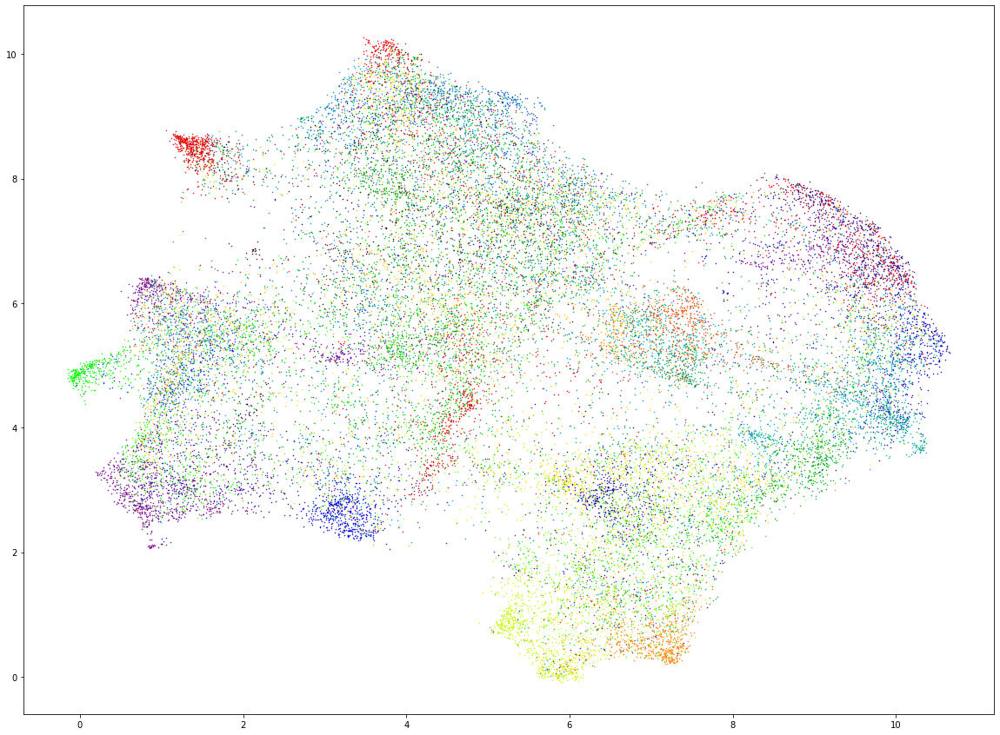

INFO:PML:Computing accuracy for the val split w.r.t ['val']
INFO:PML:running k-nn with k=600
INFO:PML:embedding dimensionality is 64
INFO:PML:running k-means clustering with k=50
INFO:PML:embedding dimensionality is 64
INFO:PML:New best accuracy! 0.0809417838197101
INFO:PML:TRAINING EPOCH 2
  0%|          | 0/937 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
total_loss=0.00050: 100%|██████████| 937/937 [02:10<00:00,  7.19it/s]
INFO:PML:Evaluating epoch 2
INFO:PML:Getting embeddings for the val split
100%|██████████| 938/938 [00:24<00:00, 38.30it/s]
INFO:PML:Running U

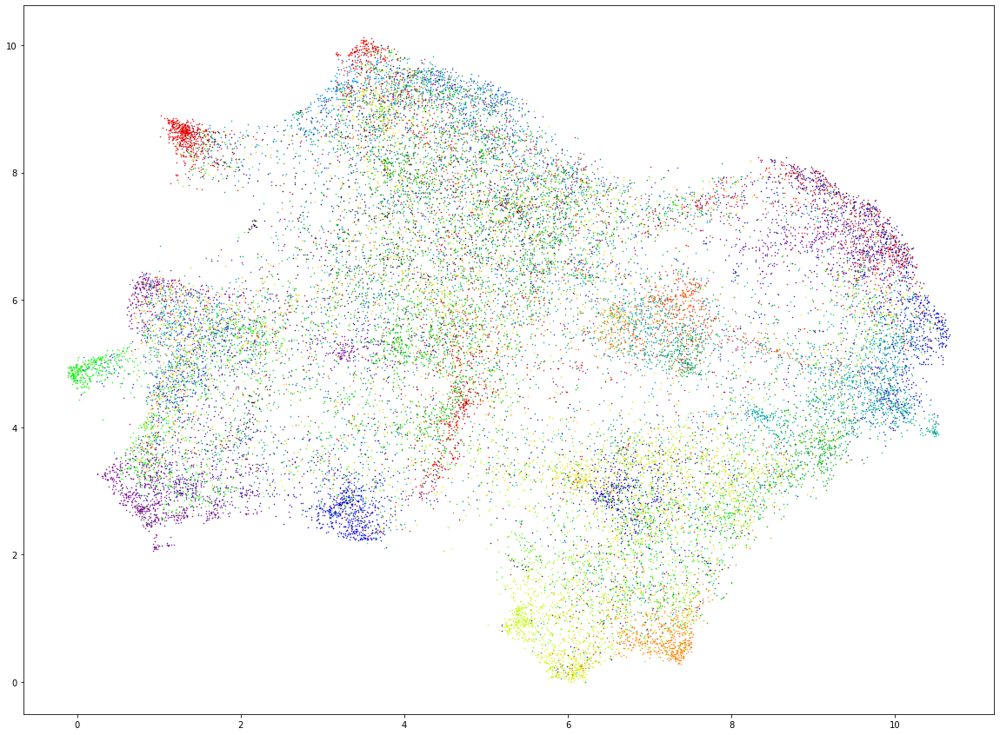

INFO:PML:Computing accuracy for the val split w.r.t ['val']
INFO:PML:running k-nn with k=600
INFO:PML:embedding dimensionality is 64
INFO:PML:running k-means clustering with k=50
INFO:PML:embedding dimensionality is 64
INFO:PML:TRAINING EPOCH 3
  0%|          | 0/937 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
total_loss=0.13033: 100%|██████████| 937/937 [05:41<00:00,  2.75it/s]
INFO:PML:Evaluating epoch 3
INFO:PML:Getting embeddings for the val split
100%|██████████| 938/938 [00:26<00:00, 35.98it/s]
INFO:PML:Running UMAP on the val set
INFO:PML:Finished UMAP
INFO:

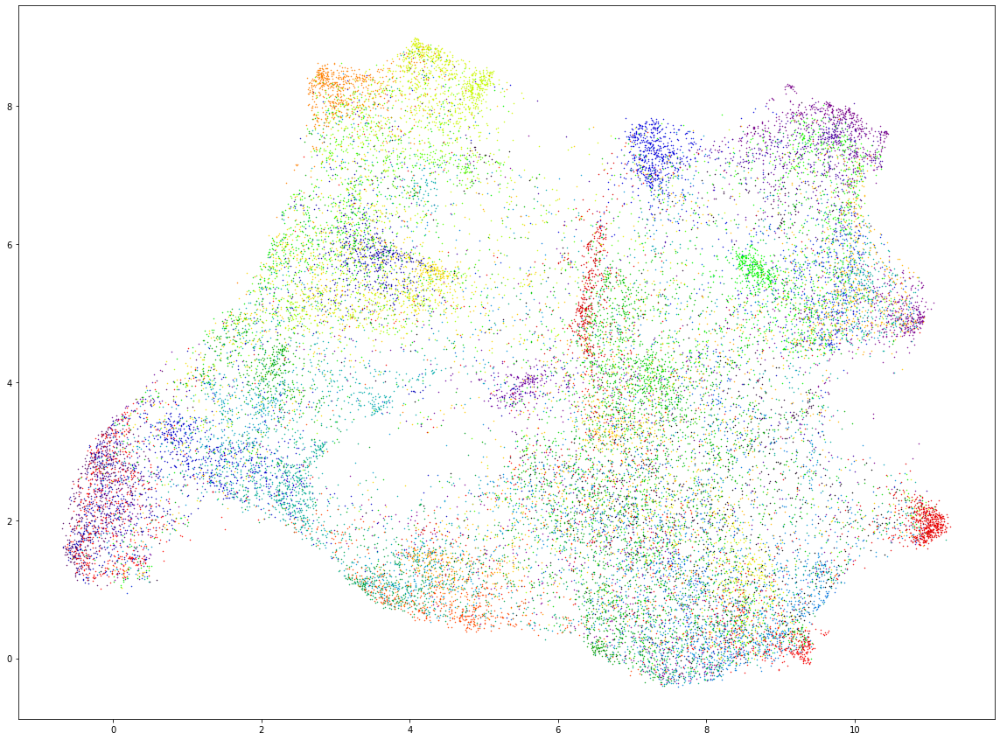

INFO:PML:Computing accuracy for the val split w.r.t ['val']
INFO:PML:running k-nn with k=600
INFO:PML:embedding dimensionality is 64
INFO:PML:running k-means clustering with k=50
INFO:PML:embedding dimensionality is 64
INFO:PML:New best accuracy! 0.0918089677019227
INFO:PML:TRAINING EPOCH 4
  0%|          | 0/937 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
total_loss=0.11380: 100%|██████████| 937/937 [05:44<00:00,  2.72it/s]
INFO:PML:Evaluating epoch 4
INFO:PML:Getting embeddings for the val split
100%|██████████| 938/938 [00:26<00:00, 34.85it/s]
INFO:PML:Running U

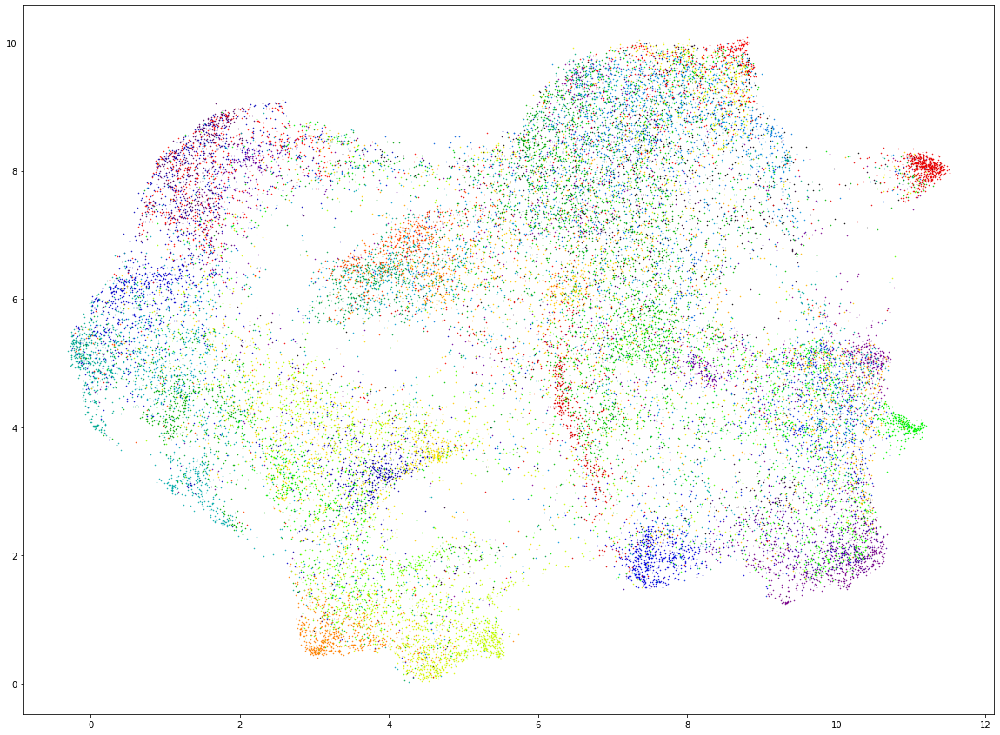

INFO:PML:Computing accuracy for the val split w.r.t ['val']
INFO:PML:running k-nn with k=600
INFO:PML:embedding dimensionality is 64
INFO:PML:running k-means clustering with k=50
INFO:PML:embedding dimensionality is 64
INFO:PML:New best accuracy! 0.09793524879843646


In [11]:
trainer.train(num_epochs=num_epochs)